Ref: https://www.youtube.com/watch?v=IGwg-PwSzlE


# 0.1 Load library

In [35]:
import pandas as pd
# import math

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import metrics

import graphviz
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import Image

# 0.2 Load dataset

In [36]:
data = pd.read_csv("/kaggle/input/nursery/nursery.data.csv", header = None)
data.head()

,0,1,2,3,4,5,6,7,8
0,usual,proper,complete,1,convenient,convenient,nonprob,recommended,recommend
1,usual,proper,complete,1,convenient,convenient,nonprob,priority,priority
2,usual,proper,complete,1,convenient,convenient,nonprob,not_recom,not_recom
3,usual,proper,complete,1,convenient,convenient,slightly_prob,recommended,recommend
4,usual,proper,complete,1,convenient,convenient,slightly_prob,priority,priority


In [37]:
data.describe()

,0,1,2,3,4,5,6,7,8
count,12960,12960,12960,12960,12960,12960,12960,12960,12960
unique,3,5,4,4,3,2,3,3,5
top,usual,proper,complete,1,convenient,convenient,nonprob,recommended,not_recom
freq,4320,2592,3240,3240,4320,6480,4320,4320,4320


# 1.1 Feature and Label


In [38]:
# Features
X = data.iloc[:, 0:8]
# Label
y = data.iloc[:, 8]

# 1.2 Spilt dataset into multiple sets

In [39]:
# Split dataste into training set and test set
ratios = [(0.4, 0.6), (0.6, 0.4), (0.8, 0.2), (0.9, 0.1)]
feature_train_sets = []
feature_test_sets = []
label_train_sets = []
label_test_sets = []

for ratio in ratios:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = ratio[1], random_state = 42)
    feature_train_sets.append(X_train)
#     print("X_train: ", X_train)
    feature_test_sets.append(X_test)
    label_train_sets.append(y_train)
#     print("y_train: ", y_train)
    label_test_sets.append(y_test)

# 1.3 Visualization function and visualize for the original dataset


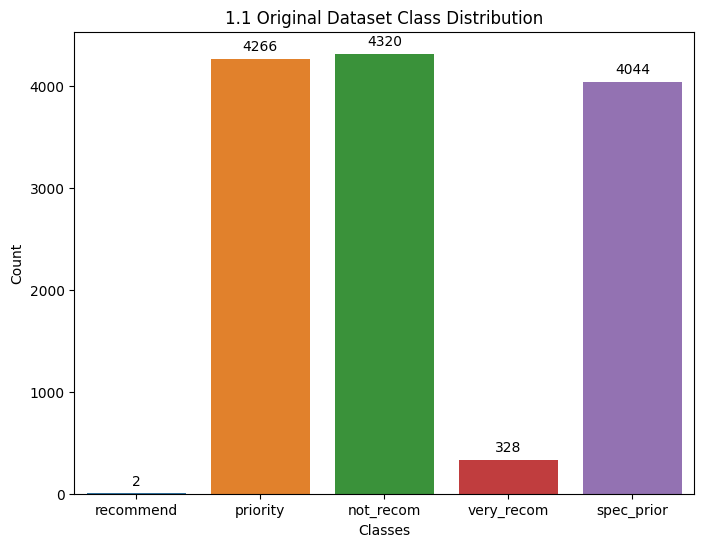

In [40]:
def plot_class_distribution(labels, title):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(x=labels)
    plt.title(title)
    plt.xlabel("Classes")
    plt.ylabel("Count")
    # Adding count numbers above each bar
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', 
                    xytext = (0, 9), 
                    textcoords = 'offset points')
    
    if title:
        save_path = title + ".png"
        plt.savefig(save_path)
    plt.show()
    
plot_class_distribution(y, "1.1 Original Dataset Class Distribution")

# 1.4 Visualize for label_train_set and label_test_set



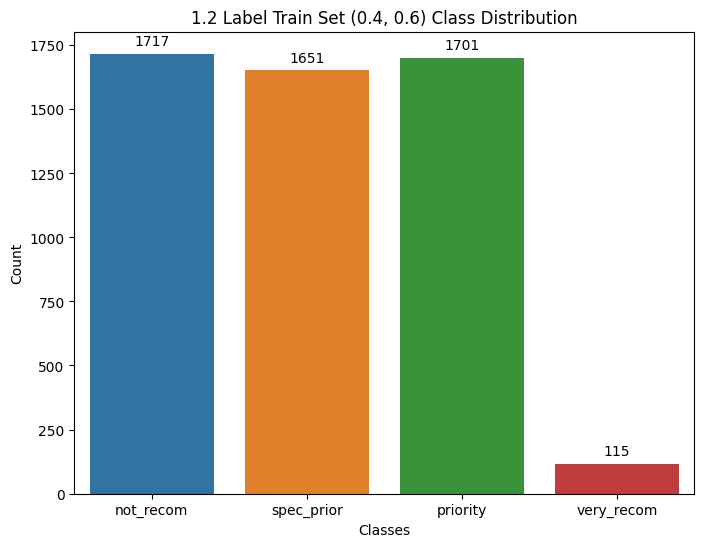

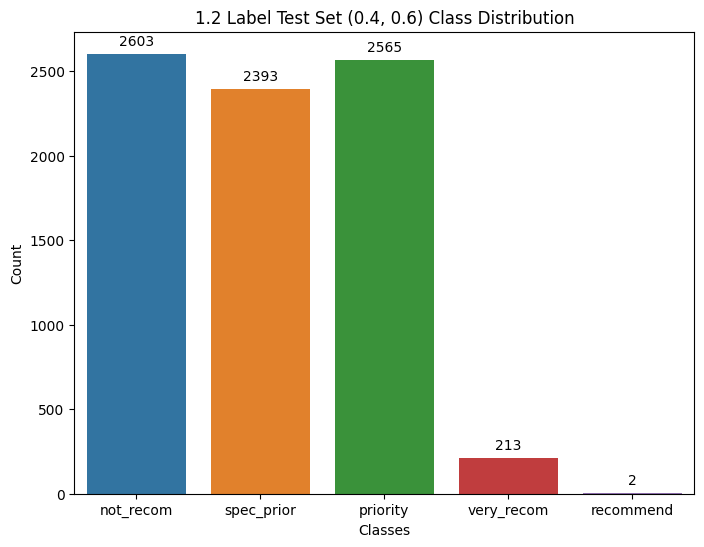

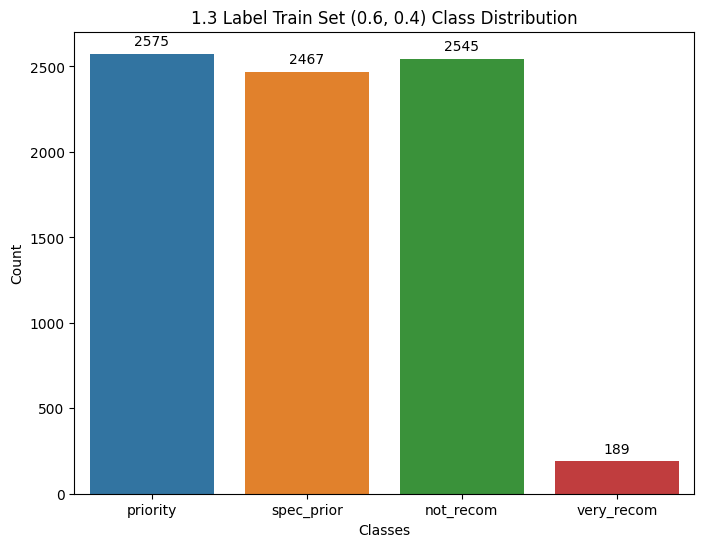

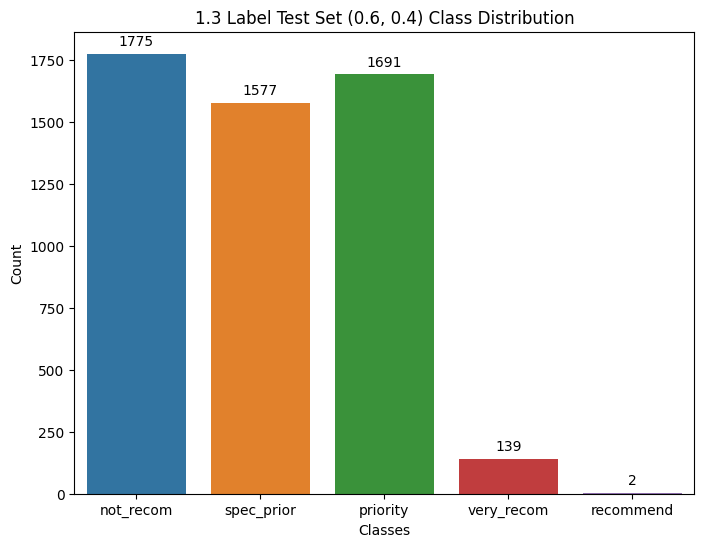

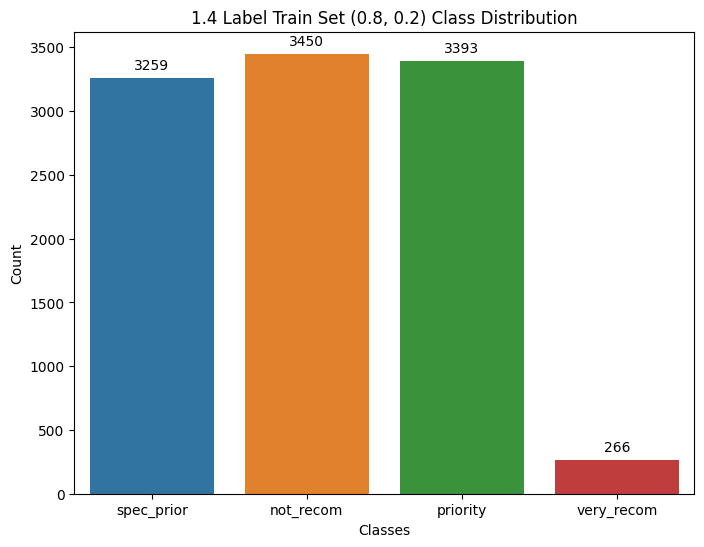

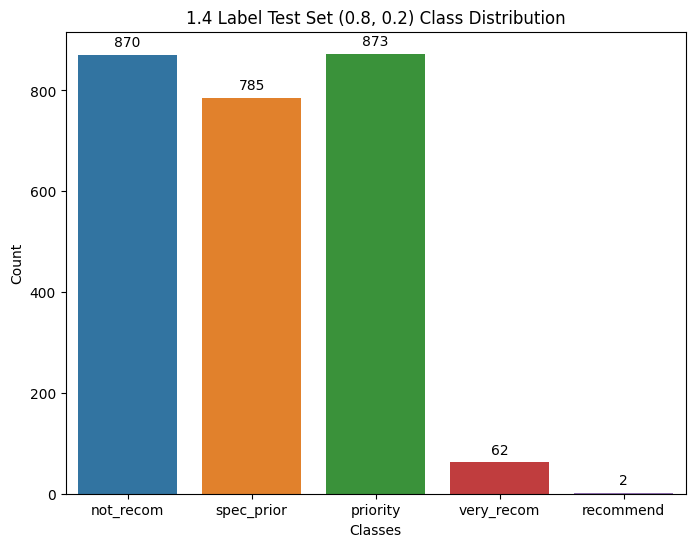

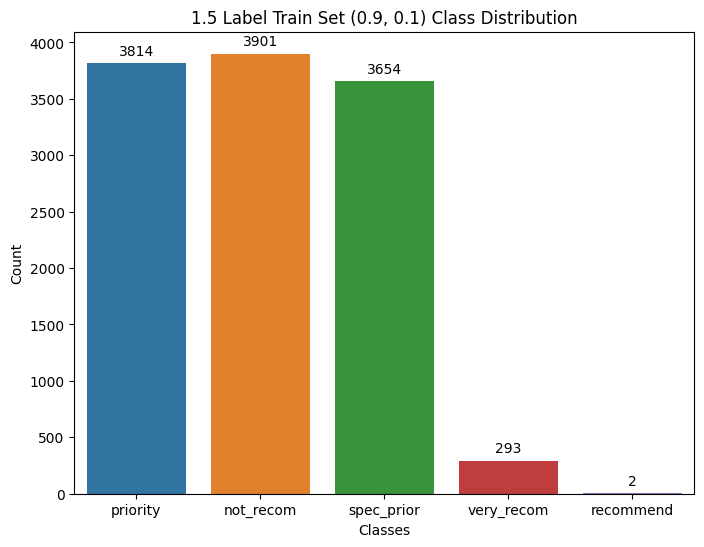

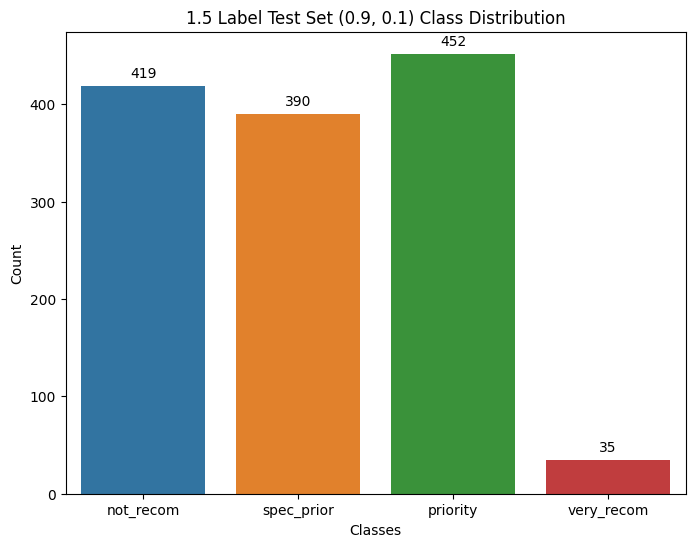

In [41]:
n = len(label_train_sets) # 4 subsets in a set

for i in range(0, n):
    title = "1." + str(i+2) + " Label Train Set " + str(ratios[i]) + " Class Distribution"
    plot_class_distribution(label_train_sets[i], title)
    title = "1." + str(i+2) + " Label Test Set " + str(ratios[i]) + " Class Distribution"
    plot_class_distribution(label_test_sets[i], title)

# 2.1 Decision tree

In [42]:
def visualize_decision_tree(clf, image_name):
    dot_data = export_graphviz(clf, out_file=None, feature_names=clf.feature_importances_, class_names=clf.classes_)
    graph = graphviz.Source(dot_data)

    graph.render(image_name, format='png', cleanup=True) 
    
    # Display the rendered image
    display(Image(f'{image_name}.png'))

def train_decision_tree(X_train, y_train, max_depth=None):
    X_train_encoded = pd.get_dummies(X_train)
    
    # Initialize DecisionTreeClassifier
    clf = DecisionTreeClassifier(criterion = "entropy", max_depth=max_depth) # Information gain
    
    # Fit classifier to training data
    clf = clf.fit(X_train_encoded, y_train)
    
    return clf

list_decision_tree = []
    
for i in range(0, n):
    # Initialize feature set and train set
    X_train = feature_train_sets[i]
    y_train = label_train_sets[i]

    decision_tree = train_decision_tree(X_train, y_train)
    list_decision_tree.append(decision_tree)

    # Visualize the decision tree
    image_name = "2." + str(i+1) + " Decision_Tree " + str(ratios[i])
    print(image_name)
    visualize_decision_tree(decision_tree, image_name)
    
#     graph = visualize_decision_tree(clf, feature_train.columns, clf.classes_)
#     graph.render(f"decision_tree_{i}")
#     graph.view()


2.1 Decision_Tree (0.4, 0.6)


2.2 Decision_Tree (0.6, 0.4)


2.3 Decision_Tree (0.8, 0.2)


2.4 Decision_Tree (0.9, 0.1)


# 3.1 Classification Report + Confusion Matrix

Classification report: 40/60:
              precision    recall  f1-score   support

   not_recom       1.00      1.00      1.00      2603
    priority       0.98      0.98      0.98      2565
   recommend       1.00      0.00      0.00         2
  spec_prior       0.98      0.98      0.98      2393
  very_recom       0.96      0.98      0.97       213

    accuracy                           0.99      7776
   macro avg       0.98      0.79      0.79      7776
weighted avg       0.99      0.99      0.98      7776



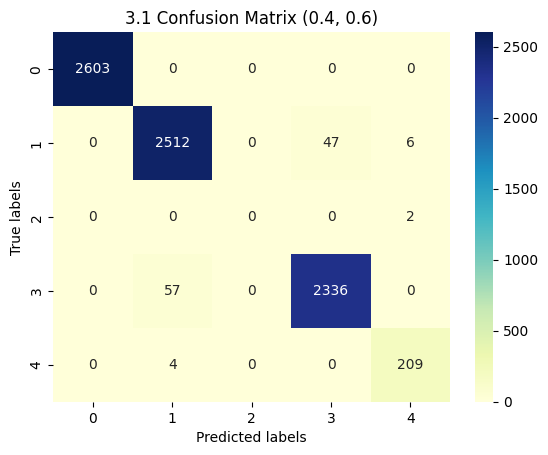

Classification report: 60/40:
              precision    recall  f1-score   support

   not_recom       1.00      1.00      1.00      1775
    priority       0.98      0.99      0.99      1691
   recommend       1.00      0.00      0.00         2
  spec_prior       0.99      0.98      0.99      1577
  very_recom       0.99      0.99      0.99       139

    accuracy                           0.99      5184
   macro avg       0.99      0.79      0.79      5184
weighted avg       0.99      0.99      0.99      5184



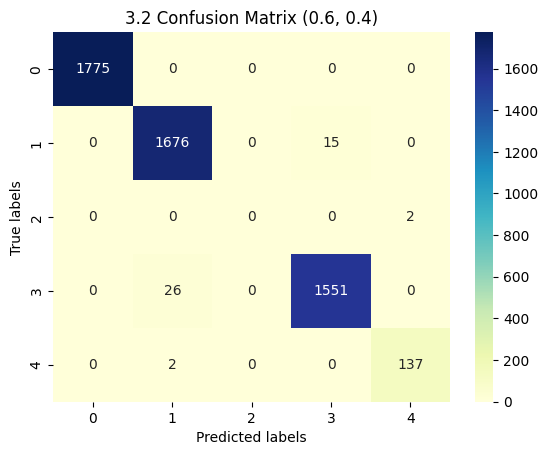

Classification report: 80/20:
              precision    recall  f1-score   support

   not_recom       1.00      1.00      1.00       870
    priority       1.00      0.99      0.99       873
   recommend       1.00      0.00      0.00         2
  spec_prior       0.99      0.99      0.99       785
  very_recom       0.94      1.00      0.97        62

    accuracy                           0.99      2592
   macro avg       0.98      0.80      0.79      2592
weighted avg       0.99      0.99      0.99      2592



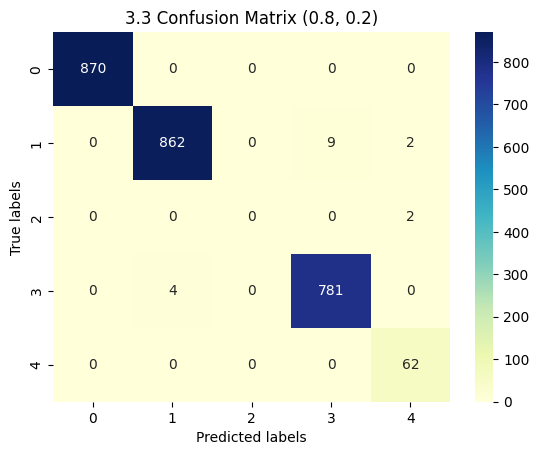

Classification report: 90/10:
              precision    recall  f1-score   support

   not_recom       1.00      1.00      1.00       419
    priority       0.99      1.00      1.00       452
  spec_prior       1.00      0.99      0.99       390
  very_recom       1.00      1.00      1.00        35

    accuracy                           1.00      1296
   macro avg       1.00      1.00      1.00      1296
weighted avg       1.00      1.00      1.00      1296



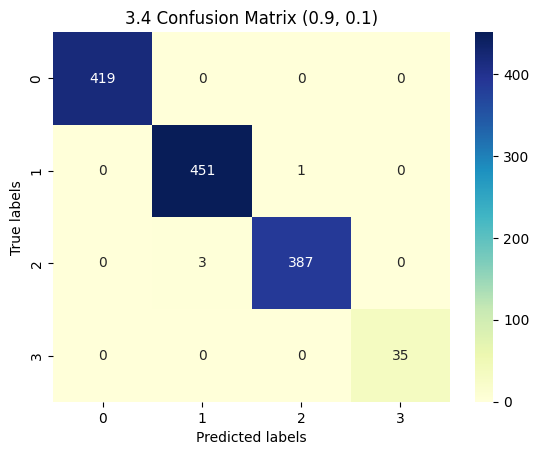

In [43]:
def plot_confusion_matrix(conf_matrix, title):
    # Visualize confusion_matrix using seaborn
    sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu", fmt="d")
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    if title:
        save_path = title + ".png"
        plt.savefig(save_path)
        
    plt.show() 
    
def create_classification_report(y_test, y_pred, ratio):
    # Classification Report
    print(f"Classification report: {int(ratio[0]*100)}/{int(ratio[1]*100)}:")
    print(classification_report(y_test, y_pred, zero_division = 1))

for i in range(0, n):
    # One-hot encode
    X_test = feature_test_sets[i]
    y_test = label_test_sets[i]
    X_test_encoded = pd.get_dummies(X_test)
    
    clf = list_decision_tree[i]

    # Prediction
    y_pred = clf.predict(X_test_encoded)
    
    # Classification Report
    ratio = ratios[i]
    create_classification_report(y_test, y_pred, ratio)
    
    
    conf_matrix = confusion_matrix(y_test, y_pred)
    # Visualize heat map
    heat_map_name = f"3.{int(i+1)} Confusion Matrix ({(ratios[i][0])}, {(ratios[i][1])})"
    plot_confusion_matrix(conf_matrix, heat_map_name)

# 4.1 Depth and accuracy of a decision tree of 80/20 set

Max depth:  None
Accuracy score:  0.9953703703703703


Max depth:  2
Accuracy score:  0.7704475308641975


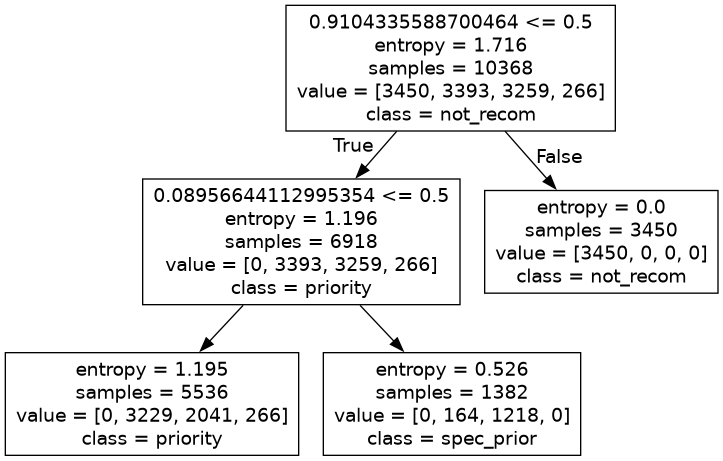

Max depth:  3
Accuracy score:  0.8159722222222222


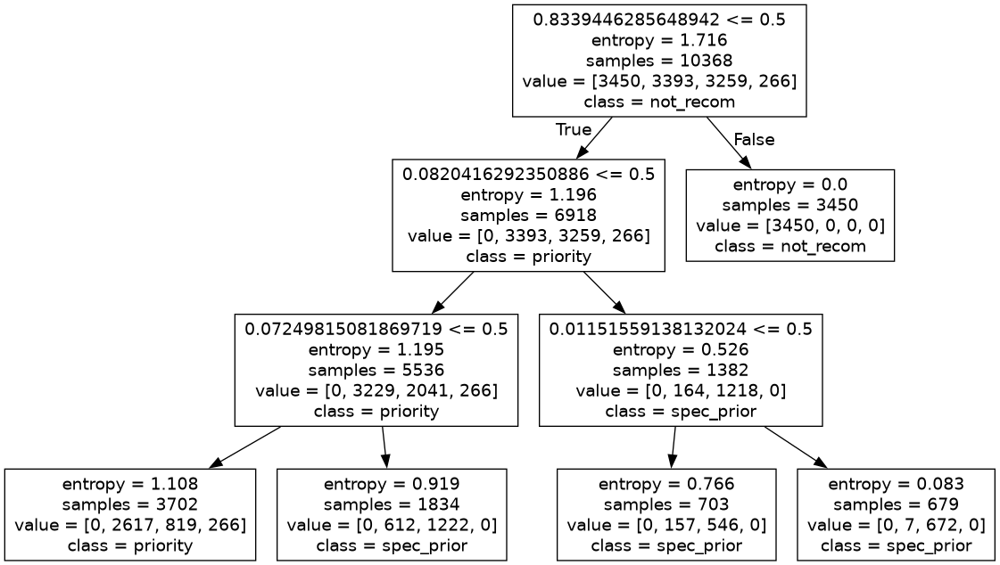

Max depth:  4
Accuracy score:  0.8441358024691358


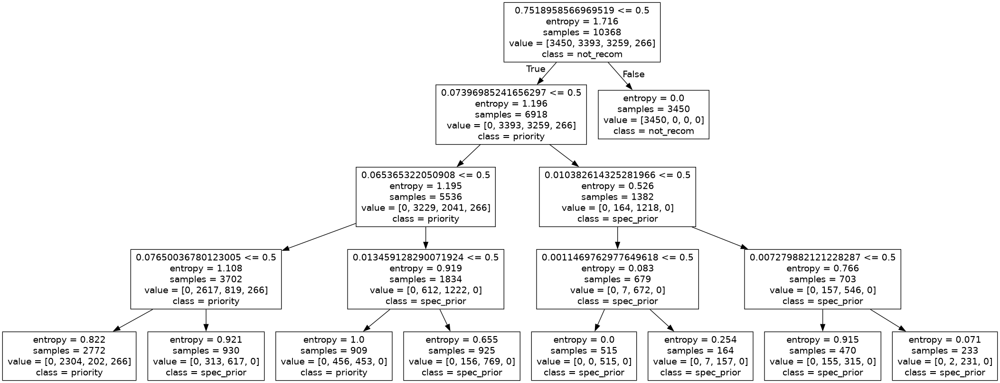

Max depth:  5
Accuracy score:  0.873070987654321


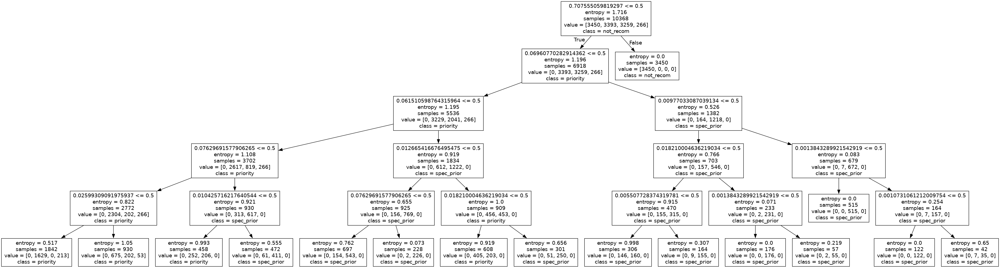

Max depth:  6
Accuracy score:  0.8823302469135802


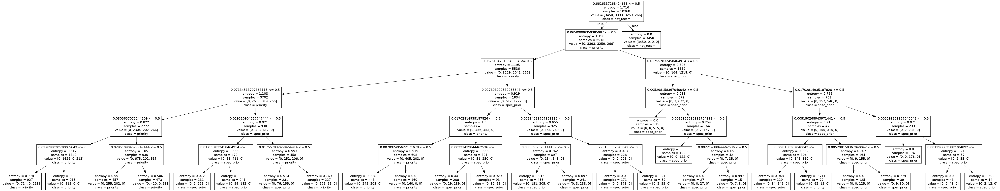

Max depth:  7
Accuracy score:  0.9131944444444444


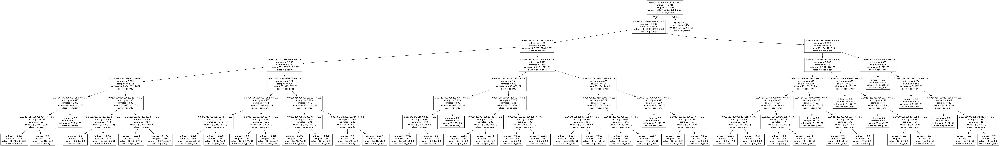

In [44]:
max_depths = [None, 2, 3, 4, 5, 6, 7]
idex = 2 # Ratio 80/20 location
ratio = ratios[idex]

# Only using 80/20 split
X_train = feature_train_sets[idex]
y_train = label_train_sets[idex]
X_test = feature_test_sets[idex]
y_test = label_test_sets[idex]

X_test_encoded = pd.get_dummies(X_test)

cnt = 0
# Train and visualize decision tree for each max_depth value
for i, max_depth in enumerate(max_depths):
    # Train tree
    decision_tree = train_decision_tree(X_train, y_train, max_depth)
    y_pred = decision_tree.predict(X_test_encoded)
    
    # Predict and report
    print("Max depth: ", max_depth)
    # Accuracy Score
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy score: ", accuracy)

    # Visualize tree
    image_name = "4." + str(i+1) + " Decision Tree " + str(ratio) + " - Max depth: " + str(max_depth)
    visualize_decision_tree(decision_tree, image_name)
    
#     file_name="/kaggle/working/" + image_name + ".png"
#     IPython.display.Image(filename=file_name)

In [79]:
!zip -r /kaggle/working/zip_file_name.zip /kaggle/working/*

  adding: kaggle/working/1.1 Original Dataset Class Distribution.png (deflated 22%)
  adding: kaggle/working/1.2 Label Test Set (0.4, 0.6) Class Distribution.png (deflated 22%)
  adding: kaggle/working/1.2 Label Train Set (0.4, 0.6) Class Distribution.png (deflated 22%)
  adding: kaggle/working/1.3 Label Test Set (0.6, 0.4) Class Distribution.png (deflated 21%)
  adding: kaggle/working/1.3 Label Train Set (0.6, 0.4) Class Distribution.png (deflated 21%)
  adding: kaggle/working/1.4 Label Test Set (0.8, 0.2) Class Distribution.png (deflated 21%)
  adding: kaggle/working/1.4 Label Train Set (0.8, 0.2) Class Distribution.png (deflated 21%)
  adding: kaggle/working/1.5 Label Test Set (0.9, 0.1) Class Distribution.png (deflated 22%)
  adding: kaggle/working/1.5 Label Train Set (0.9, 0.1) Class Distribution.png (deflated 21%)
  adding: kaggle/working/2.1 Decision_Tree (0.4, 0.6).png (deflated 20%)
  adding: kaggle/working/2.2 Decision_Tree (0.6, 0.4).png (deflated 20%)
  adding: kaggle/worki